## **Leveraging Variational Autoencoders (VAEs) for Classification of Anthropogenic Aerosols**
### **By: Aaryan Doshi, Mentor: Dr. Lamb**

# **Libraries**

Install pyroVED package to use for Variational Autoencoder

In [1]:
!pip install -q git+https://github.com/ziatdinovmax/pyroved.git

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 55.1 MB/s eta 0:00:00


In [2]:
import os
import math
import numpy as np
import seaborn as sns
import pandas as pd
import time
import random

import torch

from torch.nn import Conv1d, ConvTranspose1d
from torch.nn import Linear as Lin, ReLU, Sigmoid, ConstantPad1d
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedKFold

from matplotlib import pyplot as plt
from tqdm import tqdm

In [3]:
import pyroved as pv
import torch
import matplotlib.pyplot as plt

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Data Preprocessing and Setup**

In [5]:
# SP2 Aerosol Data
# X_train --> aerosol samples
# Y_train --> the class of each of those aerosols (0-6)

X_train = np.load("/content/drive/MyDrive/Aerosols_Proj/Lab_X_train.npy")
Y_train = np.load("/content/drive/MyDrive/Aerosols_Proj/Lab_Y_train.npy")

X_val = np.load("/content/drive/MyDrive/Aerosols_Proj/Lab_X_val.npy")
Y_val = np.load("/content/drive/MyDrive/Aerosols_Proj/Lab_Y_val.npy")

X_test = np.load("/content/drive/MyDrive/Aerosols_Proj/Lab_X_test.npy")
Y_test = np.load("/content/drive/MyDrive/Aerosols_Proj/Lab_Y_test.npy")

In [6]:
X_train.shape

(140082, 400, 4)

In [7]:
Y_train.shape

(140082,)

[ 0.02267658  0.12326274  0.20847121 -0.01025403]
[ 0.30982032  0.04053607 -0.05542687  0.21899009]
[ 0.26654275 -0.0049636   0.05294507 -0.78150558]
[ 0.23770136  0.00413633 -0.05046327 -2.51530359]
[ 2.51239157e-01  9.92720053e-03  2.48180013e-03 -2.50182776e+00]


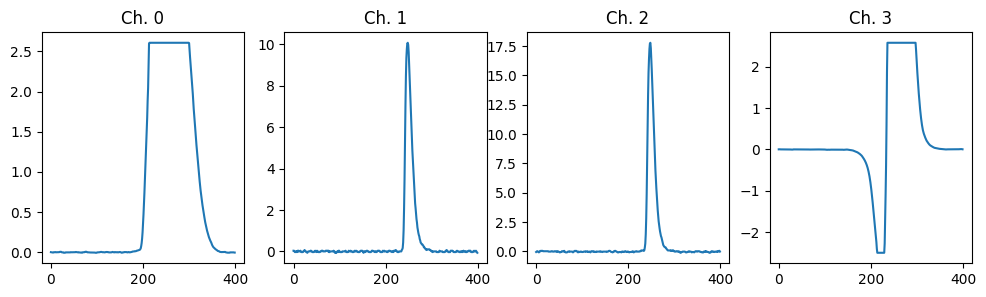

In [8]:
# Print out the channel 0, 1, 2, 3, for one random aerosol sample in X_train.
# This will be across a 400 point time series
# visualization of random channel 0, 1, 2, 3

n = random.randint(1, 140081)
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12,3))
axes[0].plot(X_train[n,:,0])
axes[0].set_title("Ch. 0")
axes[1].plot(X_train[n,:,1])
axes[1].set_title("Ch. 1")
axes[2].plot(X_train[n,:,2])
axes[2].set_title("Ch. 2")
axes[3].plot(X_train[n,:,3])
axes[3].set_title("Ch. 3")

random_indices = [random.randint(0, 140081) for _ in range(5)]

for idx in random_indices:
    print(X_train[idx, 199, :])

In [9]:
# Computing the max peak across time series of particle for all datapoints
# Will be used as parameter with latent variables
original_max_X_train = np.zeros((140082, 4))
for p_idx in range(140082):
  for c_idx in range(4):
    original_max_X_train[p_idx][c_idx] = np.max(X_train[p_idx, :, c_idx])


In [10]:
X_train.shape

(140082, 400, 4)

In [11]:
peak_height = np.max(X_train[:, :, 1])
print(peak_height)

132.61664460622106


In [12]:
# Maximum value along axis 1, channels 1 and 2 (400 points)
max1 = np.max(X_train[:, :, 1], axis=1)
max2 = np.max(X_train[:, :, 2], axis=1)

# Calculate the color channel ratio for all 400 points
# Color ratio computed by dividing channel 2 by channel 1
color_channel_ratio = max2 / max1

color_channel_ratio

array([1.11002002, 1.08262394, 1.21032505, ..., 1.52508171, 1.49707908,
       1.61149563])

In [13]:
# Preprcessing of the RAW Aerosol Data
# Performed using the channel_min and channel_max parameters

channel_min_X_train = np.zeros((140082, 4))
channel_max_X_train = np.zeros((140082, 4))

for p_idx in range(140082):
  for c_idx in range(4):
    channel_min_X_train[p_idx][c_idx] = np.min(X_train[p_idx, :, c_idx])

  for c_idx in range(4):
    channel_max_X_train[p_idx][c_idx] = np.max(X_train[p_idx, :, c_idx])


for p_idx in range (0,140082):
  for c_idx in range(0, 4):
    s0 = (X_train[p_idx,:,c_idx] - channel_min_X_train[p_idx][c_idx])/(channel_max_X_train[p_idx][c_idx]- channel_min_X_train[p_idx][c_idx])
    X_train[p_idx,:,c_idx] = s0

X_train

array([[[4.01606426e-03, 2.49376559e-03, 6.71140940e-03, 2.07009858e-01],
        [4.01606426e-03, 0.00000000e+00, 4.47427293e-03, 2.07009858e-01],
        [2.67737617e-03, 0.00000000e+00, 4.47427293e-03, 2.07009858e-01],
        ...,
        [5.35475234e-03, 2.49376559e-03, 6.71140940e-03, 2.07009858e-01],
        [1.07095047e-02, 2.49376559e-03, 1.11856823e-02, 2.07009858e-01],
        [8.03212851e-03, 2.49376559e-03, 8.94854586e-03, 2.07009858e-01]],

       [[1.90476190e-01, 5.76923077e-02, 7.01754386e-02, 3.93442623e-01],
        [1.90476190e-01, 5.76923077e-02, 7.01754386e-02, 3.77049180e-01],
        [2.38095238e-01, 3.84615385e-02, 5.26315789e-02, 3.93442623e-01],
        ...,
        [1.42857143e-01, 3.84615385e-02, 5.26315789e-02, 2.95081967e-01],
        [9.52380952e-02, 3.84615385e-02, 3.50877193e-02, 2.62295082e-01],
        [7.14285714e-02, 3.84615385e-02, 3.50877193e-02, 2.62295082e-01]],

       [[4.16666667e-01, 1.33333333e-01, 1.05263158e-01, 5.55555556e-01],
        

In [14]:
print(type(X_train))

<class 'numpy.ndarray'>


In [15]:
# FOR CHANNEL 0 ---> Initialize train loader
X_train_C0 = torch.from_numpy(X_train[:,:, 0]).float()

train_loader_0 = pv.utils.init_dataloader(X_train_C0.unsqueeze(1), batch_size=64)

fig, axes = plt.subplots(8, 8, figsize=(8, 8), dpi=300,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for ax, (y,) in zip(axes.flat, train_loader_0):
    y_use = y.numpy()
    ax.plot(y_use[0, 0])

plt.savefig('high_res_figure_channel_0.png', dpi=300)
plt.close(fig)

# HIGH Resolution Download
# from google.colab import files
# files.download('high_res_figure.png')

In [16]:
# FOR CHANNEL 1 ---> Initialize train loader

X_train_C1 = torch.from_numpy(X_train[:,:, 1]).float()

train_loader_1 = pv.utils.init_dataloader(X_train_C1.unsqueeze(1), batch_size=64)

fig, axes = plt.subplots(8, 8, figsize=(8, 8), dpi=300,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for ax, (y,) in zip(axes.flat, train_loader_1):
    y_use = y.numpy()
    ax.plot(y_use[0, 0])

plt.savefig('high_res_figure_channel_1.png', dpi=300)
plt.close(fig)

# HIGH Resolution Download
# from google.colab import files
# files.download('high_res_figure_channel_1.png')

# **Training of the Variational Autoencoder**

In [65]:
channel_0 = (140081, )

# Initialize vanilla VAE
# Change to latent_dim = 3 for 3D latent space
vae = pv.models.iVAE(data_dim = (400,), latent_dim = 2, invariances=None, seed=0)

# Initialize trainer
trainer = pv.trainers.SVItrainer(vae)

# Train for n epochs:
for e in range(55):
    trainer.step(train_loader_0)
    trainer.print_statistics()

Epoch: 1 Training loss: 84.8770
Epoch: 2 Training loss: 78.8392
Epoch: 3 Training loss: 78.2438
Epoch: 4 Training loss: 77.9359
Epoch: 5 Training loss: 77.7492
Epoch: 6 Training loss: 77.6282
Epoch: 7 Training loss: 77.5262
Epoch: 8 Training loss: 77.4543
Epoch: 9 Training loss: 77.3940
Epoch: 10 Training loss: 77.3357
Epoch: 11 Training loss: 77.2859
Epoch: 12 Training loss: 77.2549
Epoch: 13 Training loss: 77.2427
Epoch: 14 Training loss: 77.1741
Epoch: 15 Training loss: 77.1719
Epoch: 16 Training loss: 77.1509
Epoch: 17 Training loss: 77.1227
Epoch: 18 Training loss: 77.0944
Epoch: 19 Training loss: 77.0642
Epoch: 20 Training loss: 77.0516
Epoch: 21 Training loss: 77.0549
Epoch: 22 Training loss: 77.0719
Epoch: 23 Training loss: 77.0293
Epoch: 24 Training loss: 76.9803
Epoch: 25 Training loss: 77.0054
Epoch: 26 Training loss: 76.9692
Epoch: 27 Training loss: 76.9720
Epoch: 28 Training loss: 76.9310
Epoch: 29 Training loss: 76.9704
Epoch: 30 Training loss: 76.9375
Epoch: 31 Training 

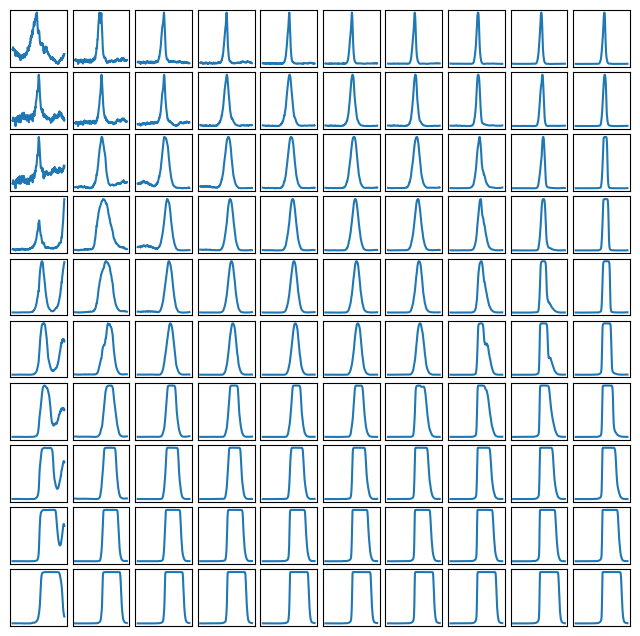

tensor([[0.2824, 0.2779, 0.2765,  ..., 0.2182, 0.2164, 0.2284],
        [0.1663, 0.1629, 0.1608,  ..., 0.1688, 0.1651, 0.1691],
        [0.1109, 0.1074, 0.1044,  ..., 0.0938, 0.0899, 0.0919],
        ...,
        [0.0042, 0.0040, 0.0038,  ..., 0.0087, 0.0082, 0.0084],
        [0.0038, 0.0037, 0.0034,  ..., 0.0074, 0.0069, 0.0071],
        [0.0039, 0.0037, 0.0034,  ..., 0.0071, 0.0066, 0.0069]])

In [18]:
# CHANNEL 0 Latent Manifold
vae.manifold2d(d=10)

In [66]:
channel_1 = (140081, )

# Initialize vanilla VAE
# Change to latent_dim = 3 for 3D latent space
vae = pv.models.iVAE(data_dim = (400,), latent_dim = 2, invariances=None, seed=0)

# Initialize trainer
trainer = pv.trainers.SVItrainer(vae)

# Train for n epochs:
for e in range(55):
    trainer.step(train_loader_1)
    trainer.print_statistics()

Epoch: 1 Training loss: 146.1990
Epoch: 2 Training loss: 139.6192
Epoch: 3 Training loss: 138.8030
Epoch: 4 Training loss: 138.4409
Epoch: 5 Training loss: 138.2559
Epoch: 6 Training loss: 138.1225
Epoch: 7 Training loss: 138.0242
Epoch: 8 Training loss: 137.9432
Epoch: 9 Training loss: 137.9002
Epoch: 10 Training loss: 137.8371
Epoch: 11 Training loss: 137.7930
Epoch: 12 Training loss: 137.7712
Epoch: 13 Training loss: 137.7333
Epoch: 14 Training loss: 137.7014
Epoch: 15 Training loss: 137.6716
Epoch: 16 Training loss: 137.6342
Epoch: 17 Training loss: 137.6285
Epoch: 18 Training loss: 137.6012
Epoch: 19 Training loss: 137.5857
Epoch: 20 Training loss: 137.5865
Epoch: 21 Training loss: 137.5675
Epoch: 22 Training loss: 137.5605
Epoch: 23 Training loss: 137.5322
Epoch: 24 Training loss: 137.5006
Epoch: 25 Training loss: 137.5167
Epoch: 26 Training loss: 137.5426
Epoch: 27 Training loss: 137.5077
Epoch: 28 Training loss: 137.4808
Epoch: 29 Training loss: 137.4863
Epoch: 30 Training loss

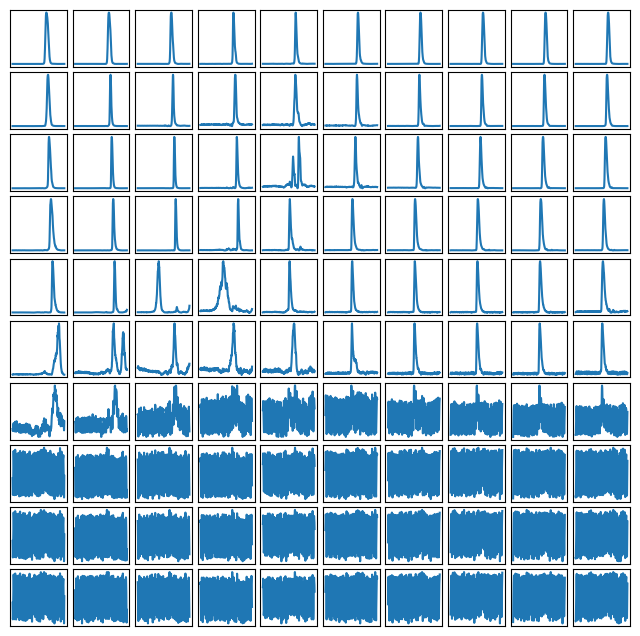

tensor([[0.0009, 0.0009, 0.0008,  ..., 0.0014, 0.0014, 0.0015],
        [0.0018, 0.0017, 0.0019,  ..., 0.0020, 0.0020, 0.0020],
        [0.0031, 0.0031, 0.0032,  ..., 0.0038, 0.0039, 0.0040],
        ...,
        [0.3913, 0.4910, 0.6198,  ..., 0.6446, 0.7134, 0.7489],
        [0.3222, 0.3962, 0.5227,  ..., 0.5615, 0.6521, 0.7096],
        [0.3331, 0.3338, 0.4105,  ..., 0.4437, 0.5607, 0.6514]])

In [21]:
# CHANNEL 1 Latent Manifold
vae.manifold2d(d = 10)

# **Latent Space Visualization**

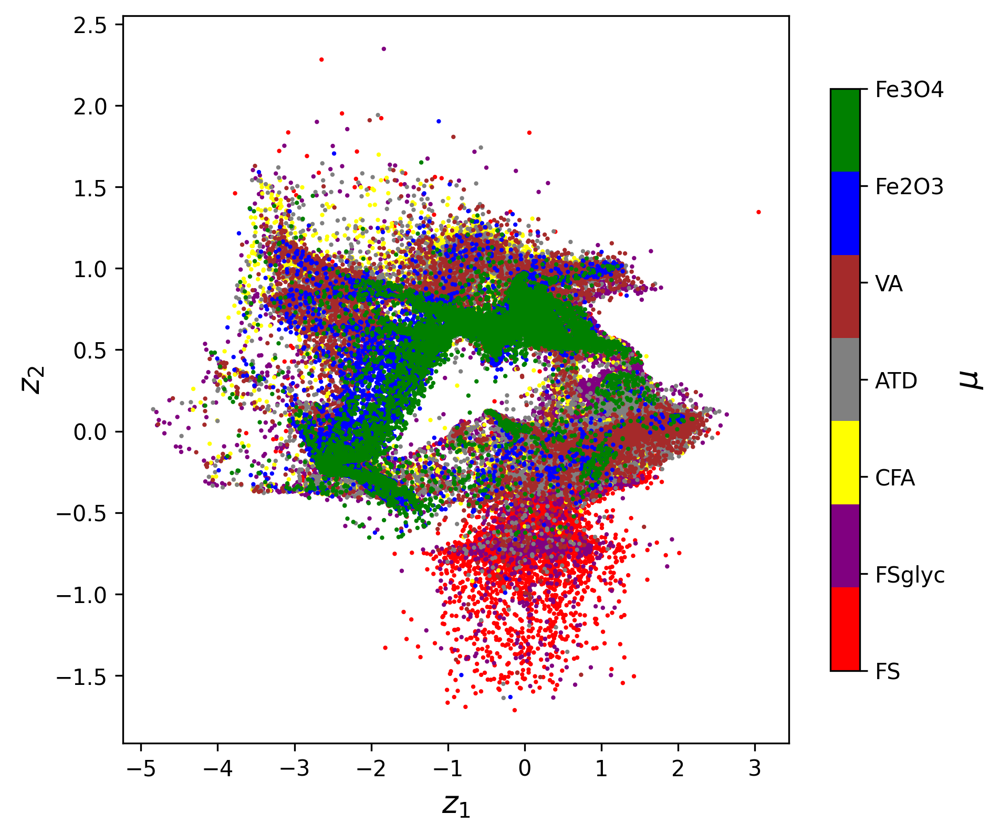

In [25]:
# 2D, CHANNEL 0, LATENT SPACE

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

z_mean, z_sd = vae.encode(X_train_C0)
fig = plt.figure(figsize=(15, 6), dpi=300)

ax1 = fig.add_subplot(121)
target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]
cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])

idx_0 = 0
im1 = ax1.scatter(z_mean[:, -1], z_mean[:, -2], s=1, c=Y_train, cmap=cmap1)

ax1.set_xlabel("$z_1$", fontsize=14)
ax1.set_ylabel("$z_2$", fontsize=14)
cbar1 = fig.colorbar(im1, ax=ax1, ticks=range(len(cmap1.colors)), shrink=.8)
cbar1.set_ticklabels(target_names)
cbar1.set_label("$\mu$", fontsize=14)

plt.savefig('new_2D_Chart.png', dpi=300)
plt.show()

# HIGH Resolution Download
# from google.colab import files
# files.download('new_2D_Chart.png')


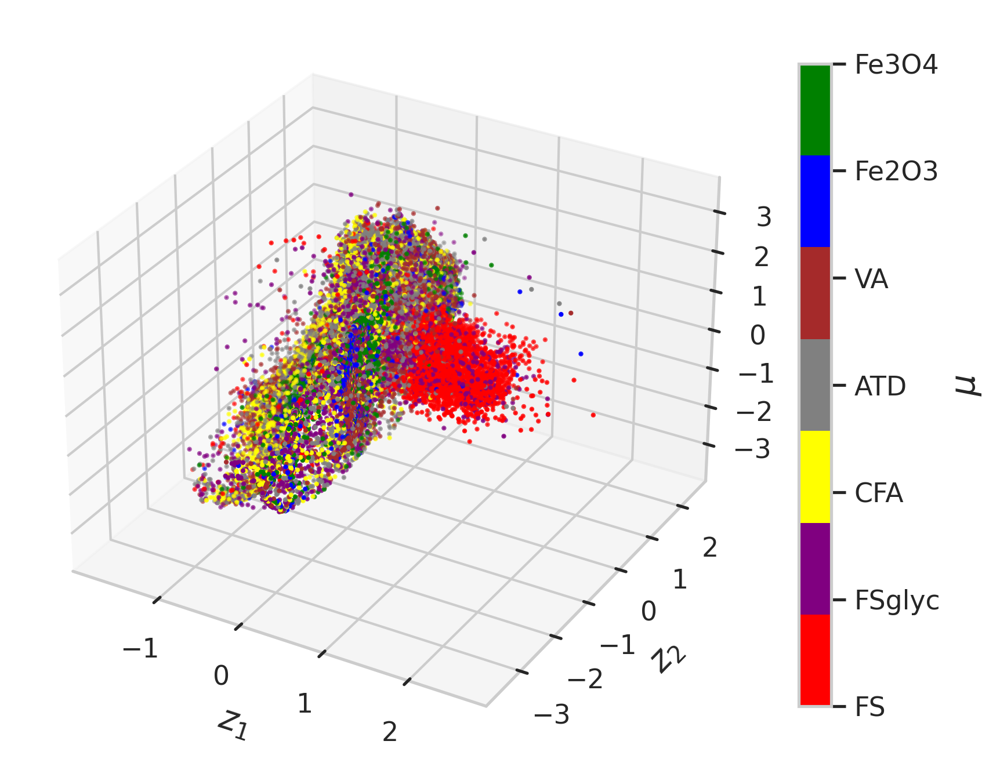

In [67]:
#3D, CHANNEL 0, LATENT SPACE

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

z_mean, z_sd = vae.encode(X_train_C0)
fig = plt.figure(figsize=(15, 6), dpi=300)
ax1 = fig.add_subplot(121, projection='3d')
target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]

cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])
im1 = ax1.scatter(z_mean[:, -1], z_mean[:, -2], z_mean[:, -3], s=1, c=Y_train, cmap=cmap1)
ax1.set_xlabel("$z_1$", fontsize=14)
ax1.set_ylabel("$z_2$", fontsize=14)
ax1.set_zlabel("$z_3$", fontsize=14)
cbar1 = fig.colorbar(im1, ax=ax1, ticks=range(len(cmap1.colors)), shrink=0.8)
cbar1.set_ticklabels(target_names)
cbar1.set_label("$\mu$", fontsize=14)

plt.savefig('3D_scatter_plots.png', dpi=300)
plt.show()
# HIGH Resolution Download
# from google.colab import files
# files.download('3D_scatter_plots.png')

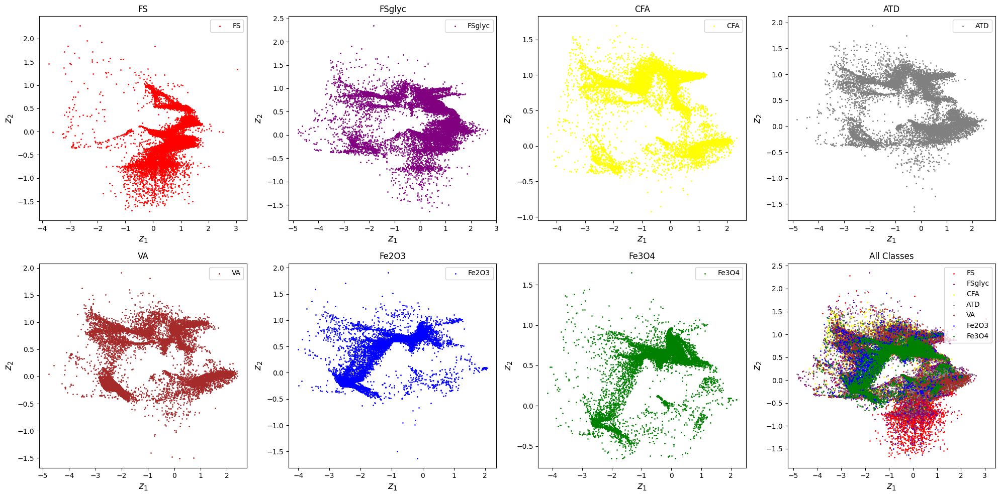

In [26]:
# CHANNEL 0, 2D, Individual Classes

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
from google.colab import files

z_mean, z_sd = vae.encode(X_train_C0)

target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]
cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])


fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for idx_0 in range(7):
    class_indices = np.where(Y_train == idx_0)
    z_mean_class = z_mean[class_indices]


    ax = axs[idx_0 // 4, idx_0 % 4]
    ax.scatter(z_mean_class[:, -1], z_mean_class[:, -2], s=1, color=cmap1(idx_0), label=target_names[idx_0])
    ax.set_xlabel("$z_1$", fontsize=14)
    ax.set_ylabel("$z_2$", fontsize=14)
    ax.legend()
    ax.set_title(target_names[idx_0])


ax_all = axs[1, 3]
for idx_0 in range(7):
    class_indices = np.where(Y_train == idx_0)
    z_mean_class = z_mean[class_indices]
    ax_all.scatter(z_mean_class[:, -1], z_mean_class[:, -2], s=1, color=cmap1(idx_0), label=target_names[idx_0])

ax_all.set_xlabel("$z_1$", fontsize=14)
ax_all.set_ylabel("$z_2$", fontsize=14)
ax_all.legend()
ax_all.set_title("All Classes")

plt.tight_layout()
filename = 'individualAerosolClass.png'
plt.savefig(filename, dpi=300)
plt.show()

# HIGH Resolution Download
# files.download(filename)

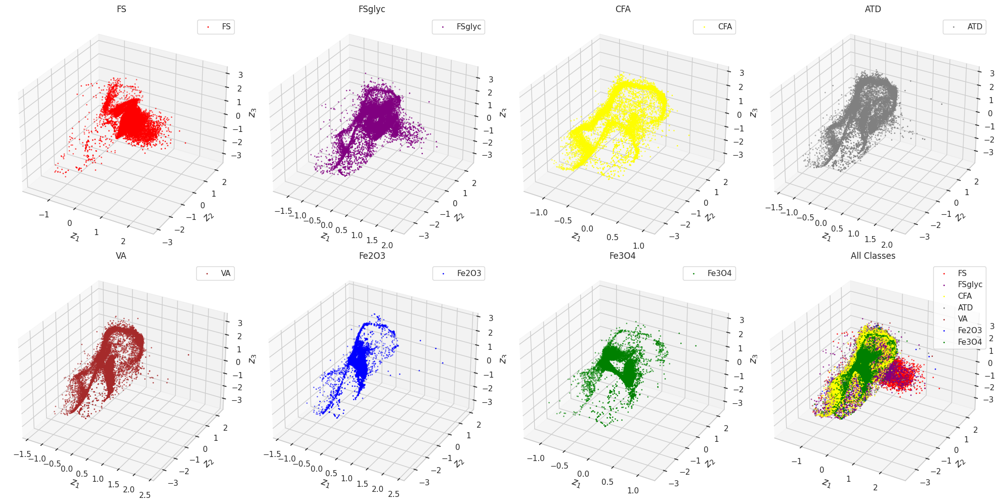

In [68]:
#CHANNEL 0, 3D, Individual Classes

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import numpy as np
from google.colab import files

z_mean, z_sd = vae.encode(X_train_C0)

target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]
cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])

fig, axs = plt.subplots(2, 4, figsize=(20, 10), subplot_kw={'projection': '3d'})

for idx_0 in range(7):
    class_indices = np.where(Y_train == idx_0)[0]  # Ensure proper indexing
    z_mean_class = z_mean[class_indices]

    ax = axs[idx_0 // 4, idx_0 % 4]
    ax.scatter(z_mean_class[:, -1], z_mean_class[:, -2], z_mean_class[:, -3], s=1, color=cmap1(idx_0), label=target_names[idx_0])
    ax.set_xlabel("$z_1$", fontsize=14)
    ax.set_ylabel("$z_2$", fontsize=14)
    ax.set_zlabel("$z_3$", fontsize=14)
    ax.legend()
    ax.set_title(target_names[idx_0])

ax_all = axs[1, 3]
for idx_0 in range(7):
    class_indices = np.where(Y_train == idx_0)[0]
    z_mean_class = z_mean[class_indices]
    ax_all.scatter(z_mean_class[:, -1], z_mean_class[:, -2], z_mean_class[:, -3], s=1, color=cmap1(idx_0), label=target_names[idx_0])

ax_all.set_xlabel("$z_1$", fontsize=14)
ax_all.set_ylabel("$z_2$", fontsize=14)
ax_all.set_zlabel("$z_3$", fontsize=14)
ax_all.legend()
ax_all.set_title("All Classes")

plt.tight_layout()
filename = '3D_individualAerosolClass.png'
plt.savefig(filename, dpi=300)
plt.show()

# HIGH Resolution Download
# files.download(filename)

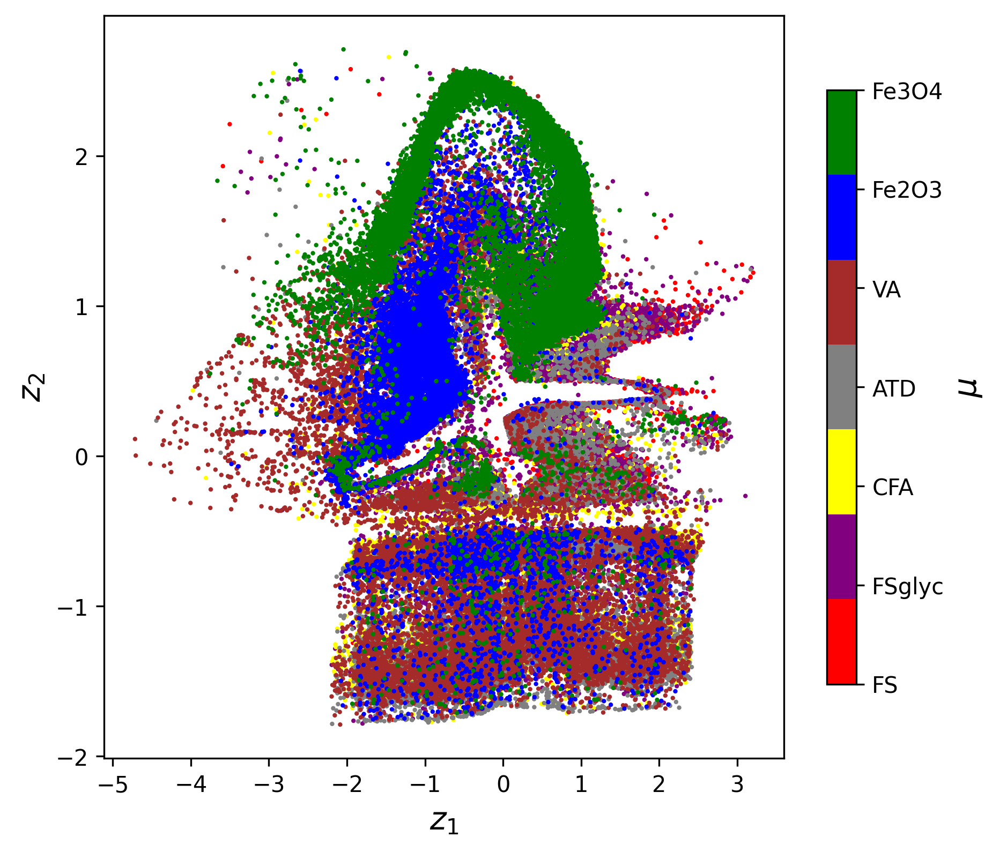

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [27]:
# 2D, CHANNEL 1, LATENT SPACE

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

z_mean_1, z_sd_1 = vae.encode(X_train_C1)
fig = plt.figure(figsize=(15, 6), dpi=300)

ax1 = fig.add_subplot(121)
target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]
cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])
im1 = ax1.scatter(z_mean_1[:, -1], z_mean_1[:, -2], s=1, c=Y_train, cmap=cmap1)
ax1.set_xlabel("$z_1$", fontsize=14)
ax1.set_ylabel("$z_2$", fontsize=14)
cbar1 = fig.colorbar(im1, ax=ax1, ticks=range(len(cmap1.colors)), shrink=.8)
cbar1.set_ticklabels(target_names)
cbar1.set_label("$\mu$", fontsize=14)

plt.savefig('high_res_scatter_plot_channel_1.png', dpi=300)
plt.show()

# HIGH Resolution Download
# from google.colab import files
# files.download('high_res_scatter_plot_channel_1.png')

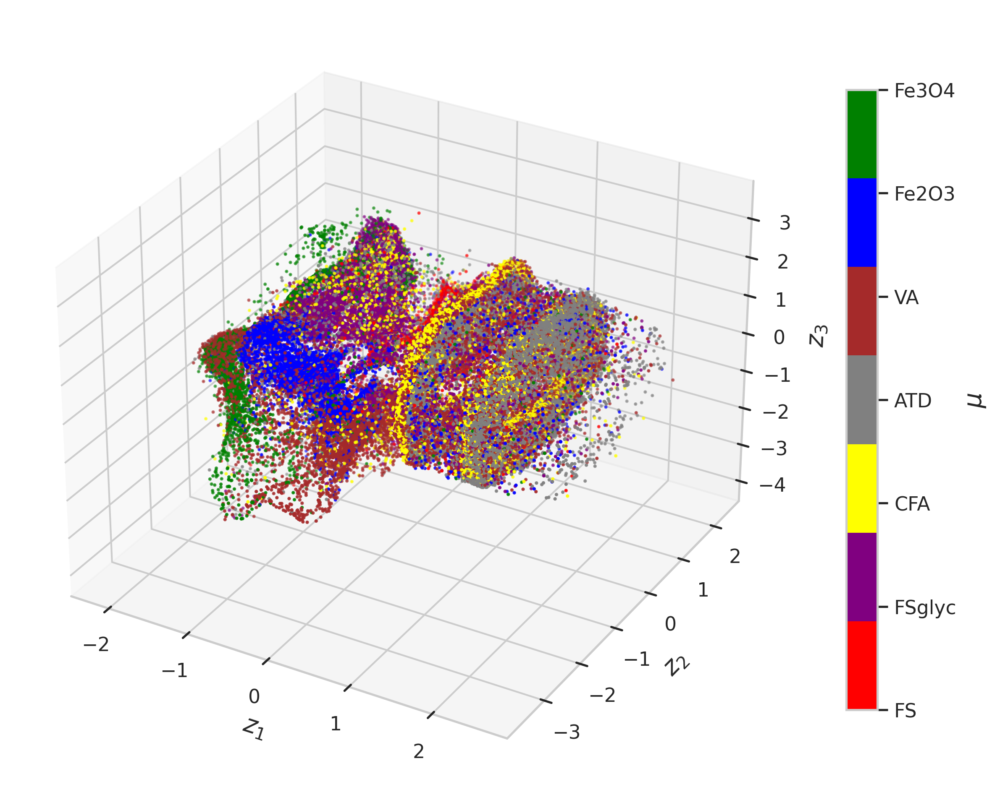

In [69]:
# 3D, CHANNEL 1, LATENT SPACE

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

z_mean_1, z_sd_1 = vae.encode(X_train_C1)
fig = plt.figure(figsize=(26, 8), dpi=300)
ax1 = fig.add_subplot(121, projection='3d')
target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]

cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])
im1 = ax1.scatter(z_mean_1[:, -1], z_mean_1[:, -2], z_mean_1[:, -3], s=1, c=Y_train, cmap=cmap1)
ax1.set_xlabel("$z_1$", fontsize=14)
ax1.set_ylabel("$z_2$", fontsize=14)
ax1.set_zlabel("$z_3$", fontsize=14)
cbar1 = fig.colorbar(im1, ax=ax1, ticks=range(len(cmap1.colors)), shrink=0.8)
cbar1.set_ticklabels(target_names)
cbar1.set_label("$\mu$", fontsize=14)

plt.savefig('3D_scatter_plots_c1.png', dpi=300)
plt.show()

# HIGH Resolution Download
# from google.colab import files
# files.download('3D_scatter_plots_c1.png')

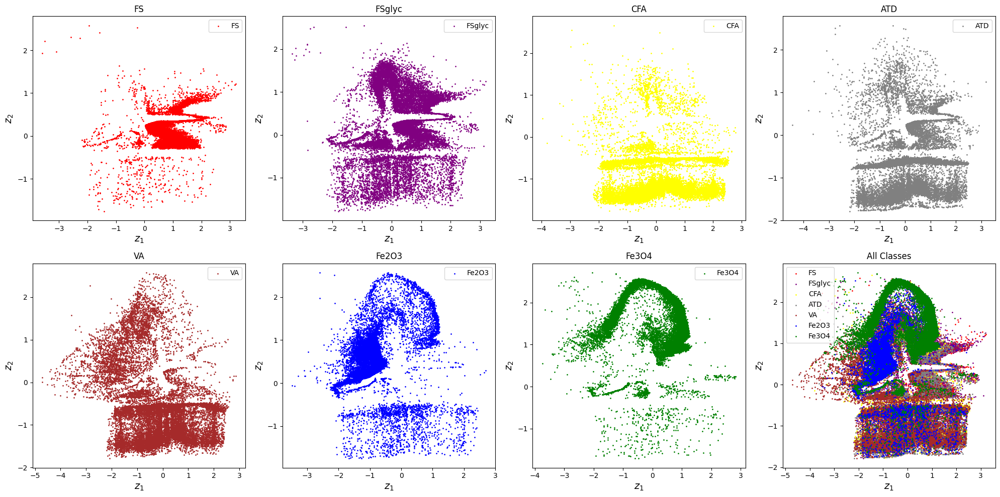

In [28]:
# CHANNEL 1, 2D, Individual Classes
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
from google.colab import files

z_mean_1, z_sd_1 = vae.encode(X_train_C1)

target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]
cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])

fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for idx_1 in range(7):
    class_indices = np.where(Y_train == idx_1)
    z_mean_class = z_mean_1[class_indices]

    ax = axs[idx_1 // 4, idx_1 % 4]
    ax.scatter(z_mean_class[:, -1], z_mean_class[:, -2], s=1, color=cmap1(idx_1), label=target_names[idx_1])
    ax.set_xlabel("$z_1$", fontsize=14)
    ax.set_ylabel("$z_2$", fontsize=14)
    ax.legend()
    ax.set_title(target_names[idx_1])

ax_all = axs[1, 3]
for idx_1 in range(7):
    class_indices = np.where(Y_train == idx_1)
    z_mean_class = z_mean_1[class_indices]
    ax_all.scatter(z_mean_class[:, -1], z_mean_class[:, -2], s=1, color=cmap1(idx_1), label=target_names[idx_1])

ax_all.set_xlabel("$z_1$", fontsize=14)
ax_all.set_ylabel("$z_2$", fontsize=14)
ax_all.legend()
ax_all.set_title("All Classes")

plt.tight_layout()
filename = 'individualAerosolClass_1.png'
plt.savefig(filename, dpi=300)
plt.show()

# HIGH Resolution Download
# files.download(filename)

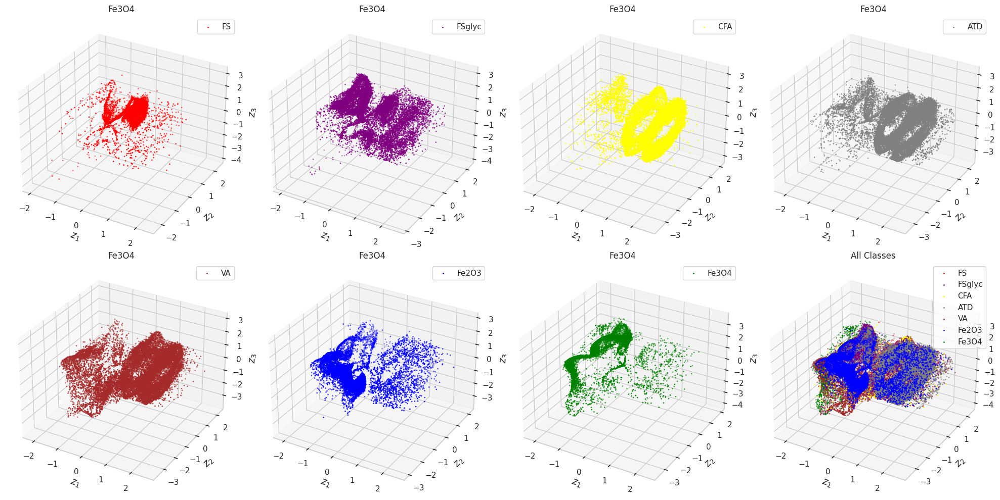

In [70]:
# CHANNEL 1, 3D, Individual Classes
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import numpy as np
from google.colab import files

z_mean_1, z_sd_1 = vae.encode(X_train_C1)

target_names = ["FS", "FSglyc", "CFA", "ATD", "VA", "Fe2O3", "Fe3O4"]
cmap1 = ListedColormap(['red', 'purple', 'yellow', 'gray', 'brown', 'blue', 'green'])

fig, axs = plt.subplots(2, 4, figsize=(20, 10), subplot_kw={'projection': '3d'})

for idx_1 in range(7):
    class_indices = np.where(Y_train == idx_1)[0]
    z_mean_class = z_mean_1[class_indices]

    ax = axs[idx_1 // 4, idx_1 % 4]
    ax.scatter(z_mean_class[:, -1], z_mean_class[:, -2], z_mean_class[:, -3], s=1, color=cmap1(idx_1), label=target_names[idx_1])
    ax.set_xlabel("$z_1$", fontsize=14)
    ax.set_ylabel("$z_2$", fontsize=14)
    ax.set_zlabel("$z_3$", fontsize=14)
    ax.legend()
    ax.set_title(target_names[idx_0])

ax_all = axs[1, 3]
for idx_1 in range(7):
    class_indices = np.where(Y_train == idx_1)[0]
    z_mean_class = z_mean_1[class_indices]
    ax_all.scatter(z_mean_class[:, -1], z_mean_class[:, -2], z_mean_class[:, -3], s=1, color=cmap1(idx_1), label=target_names[idx_1])

ax_all.set_xlabel("$z_1$", fontsize=14)
ax_all.set_ylabel("$z_2$", fontsize=14)
ax_all.set_zlabel("$z_3$", fontsize=14)
ax_all.legend()
ax_all.set_title("All Classes")

plt.tight_layout()
filename = '3D_individualAerosolClass_channel_1.png'
plt.savefig(filename, dpi=300)
plt.show()

# HIGH Resolution Download
# files.download(filename)

# **Computation of Properties**

In [33]:
X_train_C0.shape

torch.Size([140082, 400])

In [34]:
X_train.shape

(140082, 400, 4)

In [35]:
original_max_X_train.shape

(140082, 4)

In [36]:
incandescent_max = []
incandescent_max = original_max_X_train[:, 1]

new_incandescent_max = np.expand_dims(incandescent_max, axis = 1)
new_incandescent_max.shape

(140082, 1)

In [37]:
X_train.shape

(140082, 400, 4)

In [38]:
scattering = []
scattering = original_max_X_train[:, 0]

new_scattering = np.expand_dims(scattering, axis = 1)
new_scattering.shape

(140082, 1)

In [39]:
z_mean.shape

torch.Size([140082, 2])

In [40]:
z_mean_1.shape

torch.Size([140082, 2])

In [41]:
print(z_mean.numpy().shape)
print(z_mean_1.numpy().shape)
print(new_scattering.shape)
print(new_incandescent_max.shape)
print(color_channel_ratio.shape)


(140082, 2)
(140082, 2)
(140082, 1)
(140082, 1)
(140082,)


Processing color ratio, incandescent max, saturation, peak height
```



In [42]:
color_channel_ratio.shape
color_channel_ratio = np.array(color_channel_ratio)
color_channel_ratio = np.expand_dims(color_channel_ratio, axis = 1)

color_channel_ratio.shape

(140082, 1)

In [43]:
np.count_nonzero(np.isinf(color_channel_ratio))
bad_data = np.isinf(color_channel_ratio)
bad_data = bad_data[:, 0]
bad_data.shape

(140082,)

In [45]:
from sklearn.preprocessing import MinMaxScaler
X_all = np.concatenate((z_mean.numpy(), z_mean_1.numpy(), new_scattering, new_incandescent_max, color_channel_ratio), axis = 1)
X_filtered = X_all[~bad_data,:]
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_filtered)
X_scaled.shape

# X_scaled contains X_train without outliers
# X_scaled contains those three properties as well

(140082, 7)

In [46]:
# Removing the Outliers
Y_filtered = Y_train[~bad_data]
Y_filtered
Y_filtered.shape

(140082,)

In [47]:
z_mean.shape

torch.Size([140082, 2])

In [48]:
z_mean_1.shape

torch.Size([140082, 2])

In [49]:
new_scattering.shape

(140082, 1)

In [50]:
new_scattering

array([[0.9186803 ],
       [0.04637546],
       [0.00833333],
       ...,
       [2.61570632],
       [2.61654275],
       [2.61728625]])

In [51]:
new_incandescent_max

array([[13.22634017],
       [ 1.65205162],
       [ 0.43266049],
       ...,
       [23.28590338],
       [ 9.48792191],
       [23.54649239]])

In [52]:
color_channel_ratio

array([[1.11002002],
       [1.08262394],
       [1.21032505],
       ...,
       [1.52508171],
       [1.49707908],
       [1.61149563]])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


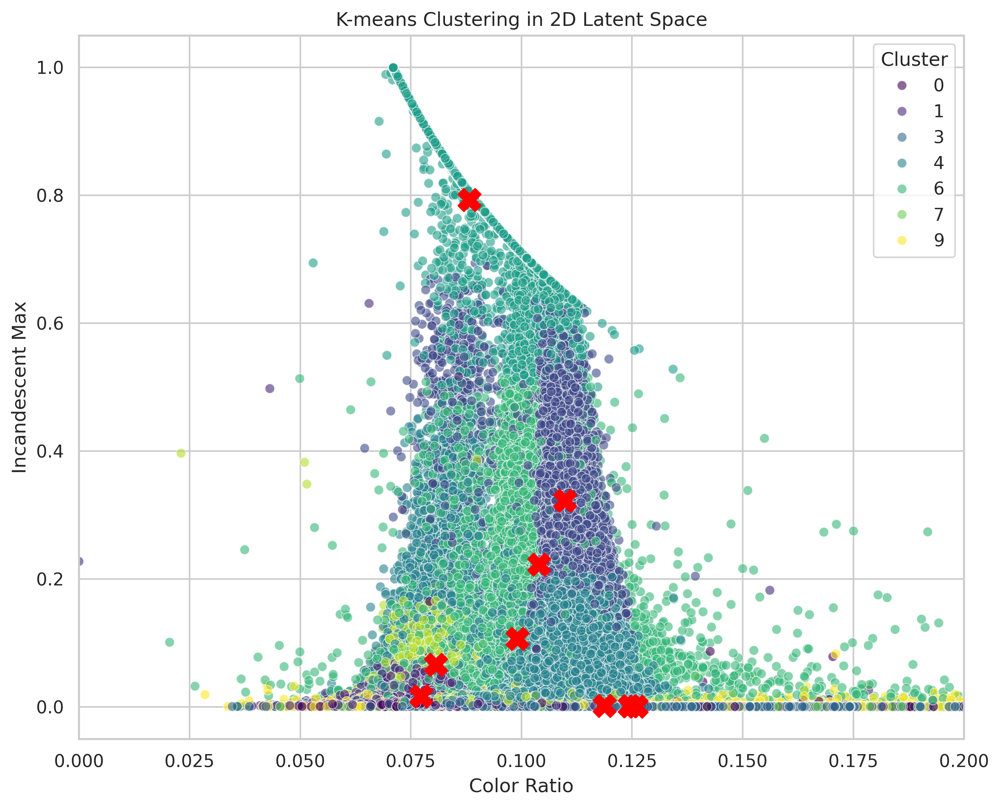

In [55]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X_scaled)

kmeans_labels = kmeans.labels_
kmeans_centers = kmeans.cluster_centers_

data = pd.DataFrame(X_scaled, columns=['z1', 'z2', 'z3', 'z4', 'scattering_max', 'incandescent_max', 'color_ratio'])
data['Cluster'] = kmeans_labels

sns.set_theme(style="whitegrid")
plt.figure(figsize=(10, 8), dpi=300)
sns.scatterplot(data=data, x='color_ratio', y='incandescent_max', hue='Cluster', palette='viridis', alpha=0.6)

for center in kmeans_centers:
    plt.scatter(center[6], center[5], s=200, c='red', marker='X')

plt.title('K-means Clustering in 2D Latent Space')
plt.xlabel('Color Ratio')
plt.ylabel('Incandescent Max')
plt.xlim(0, 0.2)
plt.legend(title='Cluster')

plt.savefig('kmeans_clustering_high_res.png', dpi=300)
plt.show()

# HIGH Resolution Download
# from google.colab import files
# files.download('kmeans_clustering_high_res.png')

# **Visualization of the Color Ratio**

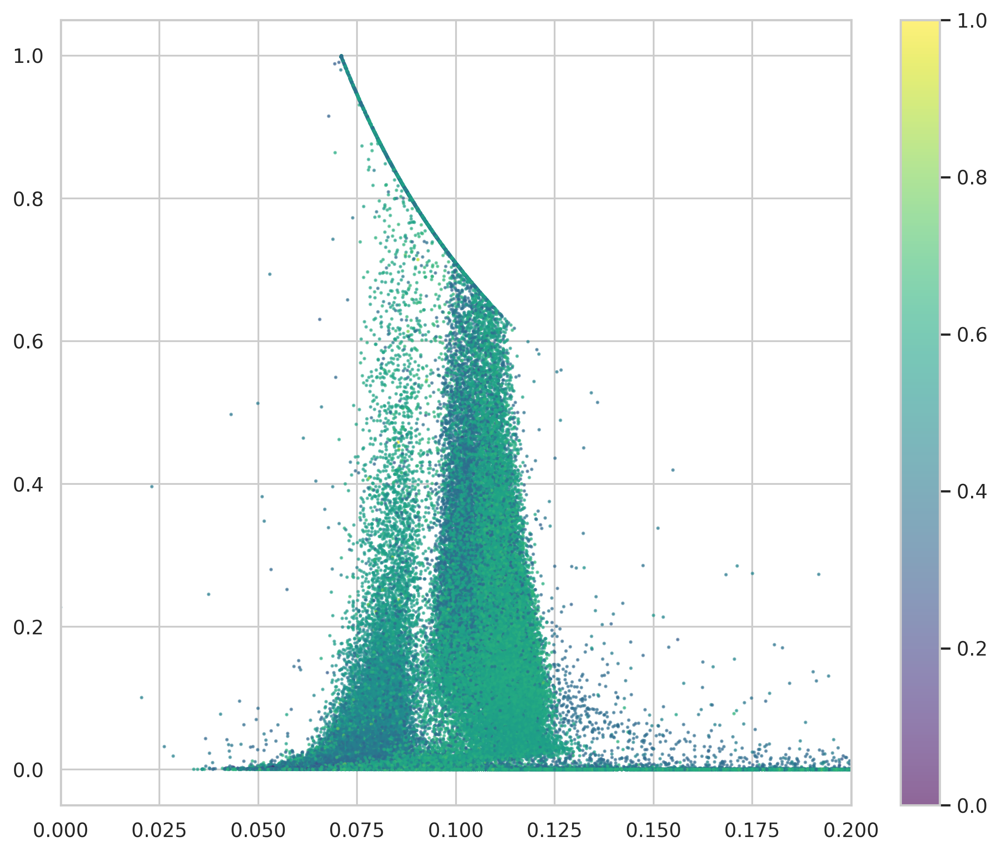

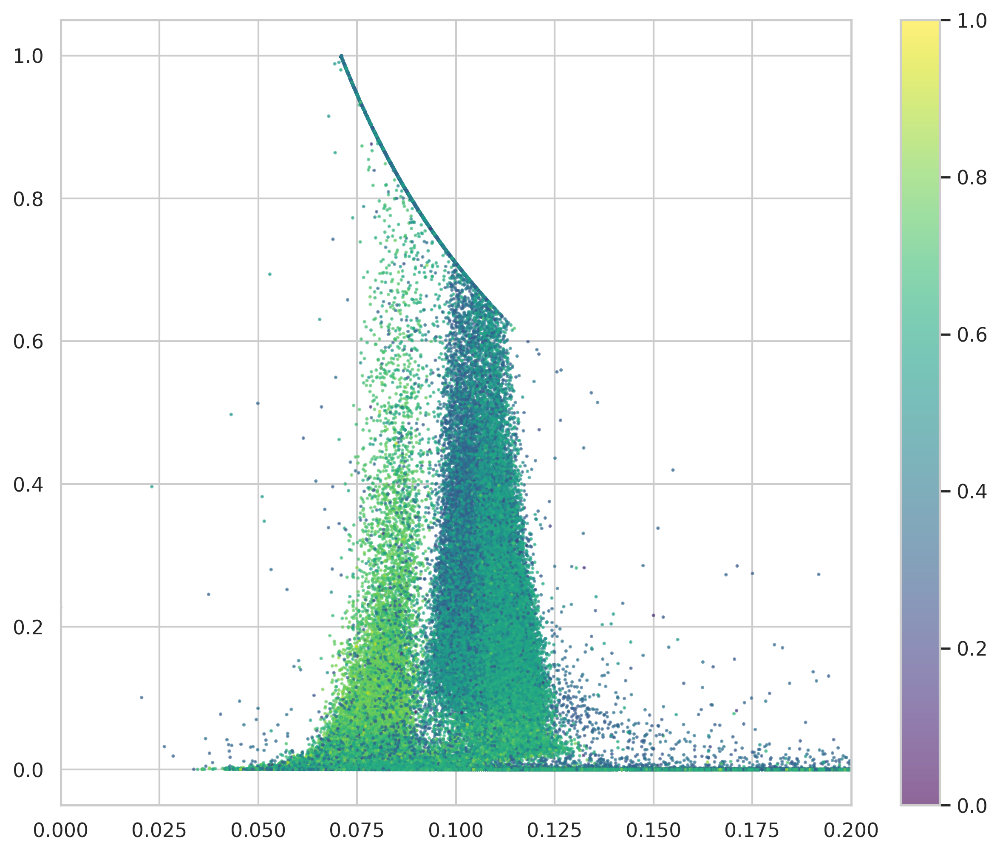

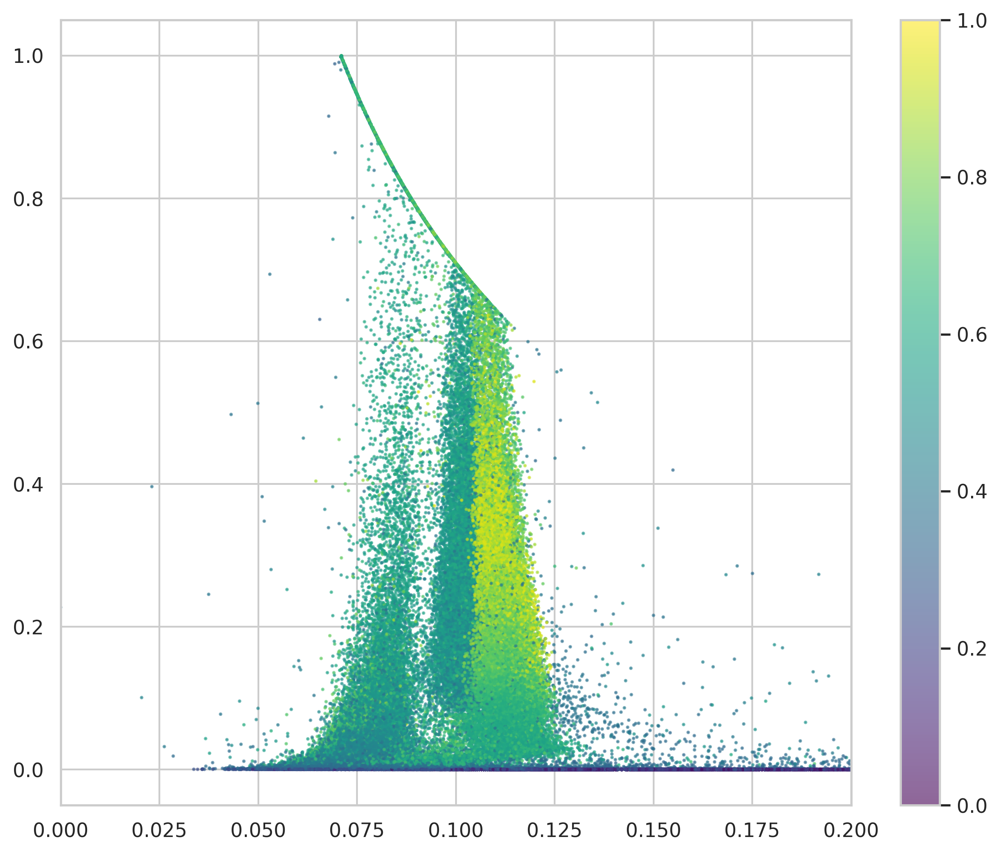

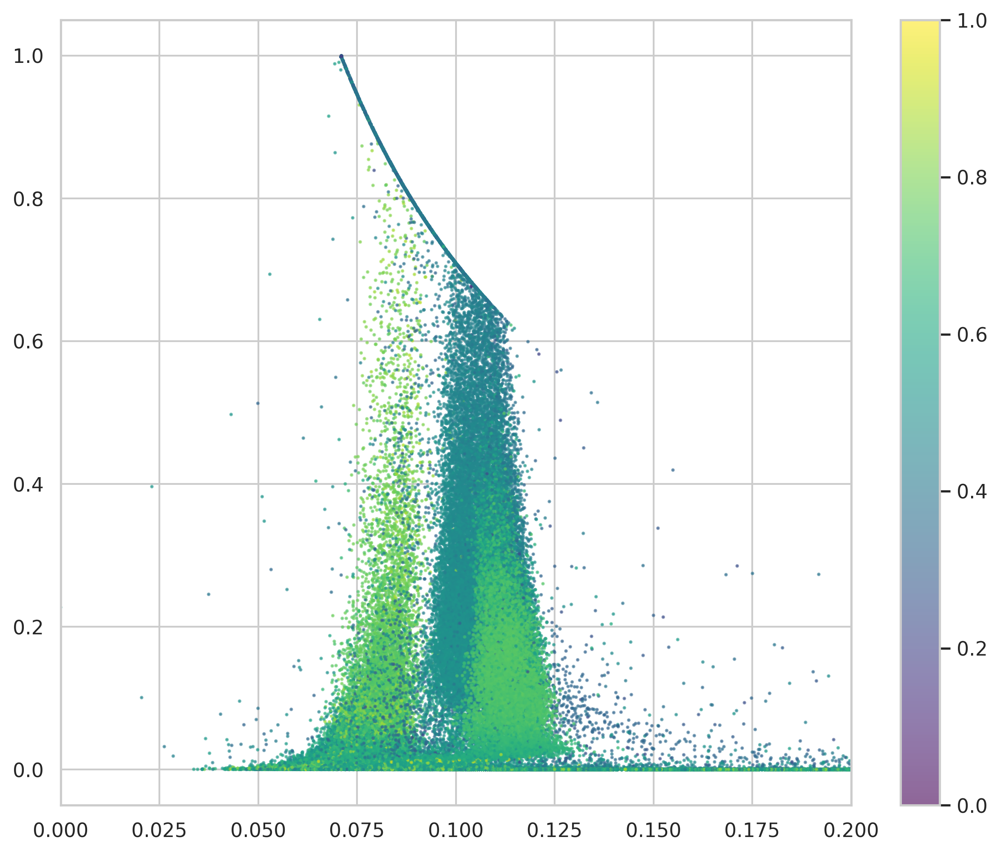

In [57]:
from google.colab import files

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8), dpi=300)
plt.xlim(0, 0.2)
plt.scatter(data['color_ratio'], data['incandescent_max'], c=data['z1'], s=1, cmap='viridis', alpha=0.6)
plt.colorbar()
plt.savefig('scatter_plot_z1_high_res.png', dpi=300)
# HIGH Resolution Download
# plt.close()
# files.download('scatter_plot_z1_high_res.png')


plt.figure(figsize=(10, 8), dpi=300)
plt.xlim(0, 0.2)
plt.scatter(data['color_ratio'], data['incandescent_max'], c=data['z2'], s=1, cmap='viridis', alpha=0.6)
plt.colorbar()
plt.savefig('scatter_plot_z2_high_res.png', dpi=300)
# HIGH Resolution Download
# plt.close()
# files.download("scatter_plot_z2_high_res.png")

plt.figure(figsize=(10, 8), dpi=300)
plt.xlim(0, 0.2)
plt.scatter(data['color_ratio'], data['incandescent_max'], c=data['z3'], s=1, cmap='viridis', alpha=0.6)
plt.colorbar()
plt.savefig('scatter_plot_z3_high_res.png', dpi=300)
# HIGH Resolution Download
# plt.close()
# files.download("scatter_plot_z3_high_res.png")

plt.figure(figsize=(10, 8), dpi=300)
plt.xlim(0, 0.2)
plt.scatter(data['color_ratio'], data['incandescent_max'], c=data['z4'], s=1, cmap='viridis', alpha=0.6)
plt.colorbar()
plt.savefig('scatter_plot_z4_high_res.png', dpi=300)
# HIGH Resolution Download
# plt.close()
# files.download("scatter_plot_z4_high_res.png")

# **Random Forest Verification**

In [58]:
from sklearn.model_selection import train_test_split
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_scaled, Y_filtered, test_size=0.33, random_state=42)

In [59]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train_rf, y_train_rf)

RandomForestClassifier()

In [60]:
y_output = rf.predict(X_test_rf)

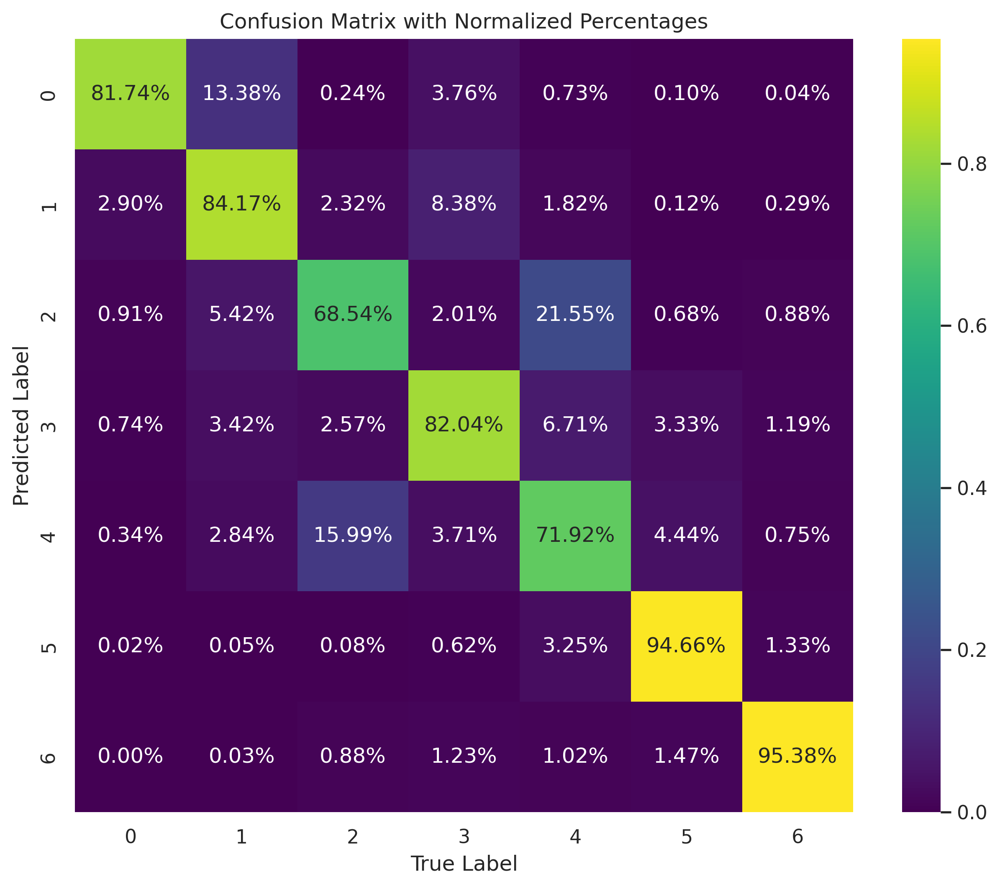

In [61]:
# CONFUSION Matrix for Random Forest Algorithmn
# Illustrates the feasibility of Unsupervised Approach

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import files

correlation_arr = confusion_matrix(y_output, y_test_rf, normalize='true')

plt.figure(figsize=(10, 8), dpi=300)
ax = sns.heatmap(correlation_arr, annot=True, fmt=".2%", cmap='viridis')
ax.set_title('Confusion Matrix with Normalized Percentages')
ax.set_ylabel('Predicted Label')
ax.set_xlabel('True Label')

plt.savefig('confusion_matrix_high_res.png', dpi=300)
plt.show()
# HIGH Resolution Download
# files.download('confusion_matrix_high_res.png')